### Outline
Draw wild types and corresponding mutants
investigate their embeddings


In [7]:
from myesm.datasets import *
import torch
from sklearn.decomposition import PCA

from lightning.pytorch.callbacks import ModelCheckpoint
from torch.utils.data import Dataset
global top_path  # the path of the top_level directory
global script_path, data_path, logging_path
import os, sys
from torch.utils.data import DataLoader
import esm
from argparse import ArgumentParser
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from myesm.model import *

### Visualizations of Embeddings from esm2_t6_8M_UR50D()
#### It does not work ---- try a larger model

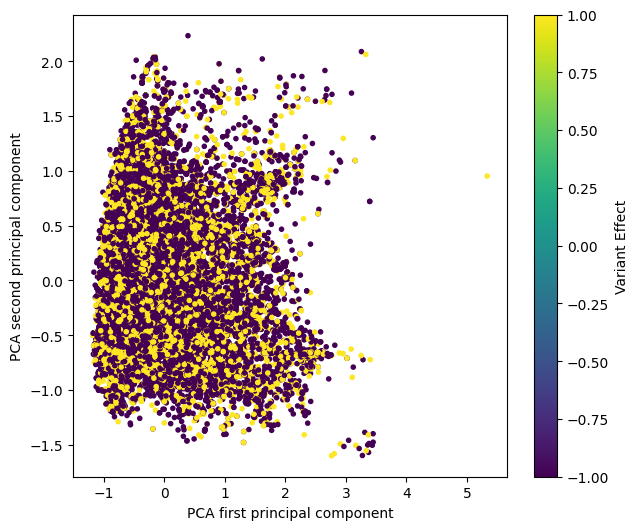

In [5]:
seq=torch.load('/scratch/user/zshuying/ppi_mutation/data/2019_all_esm_embeddings.pt')
label=torch.load('/scratch/user/zshuying/ppi_mutation/data/2019_all_labels_for_embeddings.pt')
from sklearn.decomposition import PCA
pca = PCA(20)
X= pca.fit_transform(seq)
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = ax.scatter(X[:,0], X[:,1], c=label, marker='.')
ax.set_xlabel('PCA first principal component')
ax.set_ylabel('PCA second principal component')
plt.colorbar(sc, label='Variant Effect')

In [ ]:
a[0].shape

torch.Size([4, 4])

In [ ]:
import matplotlib.pyplot as plt
def pred_batch(ds, uniprot):
    model, alphabet = esm.pretrained.esm2_t33_650M_UR50D()
    batch_converter = alphabet.get_batch_converter()
    model.eval()
    idxes=ds.get_idx_from_uniprot(uniprot)
    newds=copy.deepcopy(ds)
    newds.all_sequences=ds.all_sequences[ds.all_sequences['UniProt']==uniprot]
    data=[('%s'%name,'%s'%seq) for name, seq in zip(newds.all_sequences['Name'],newds.all_sequences['Seq'])]
    # get the embeddings one by one
    for item in data:
        batch_labels, batch_strs, batch_tokens = batch_converter([item])
        batch_lens = (batch_tokens != alphabet.padding_idx).sum(1)
        with torch.no_grad():
            results = model.cuda()(batch_tokens.cuda(), repr_layers=[33], return_contacts=False)
        token_representations = results["representations"][33].cpu()
        plt.matshow(token_representations[0])
        plt.title(batch_labels)
        del batch_labels,batch_strs,batch_tokens,item,results,token_representations
        torch.cuda.empty_cache()


def pred_batch_delta(ds, uniprot):
    model, alphabet = esm.pretrained.esm2_t33_650M_UR50D()
    batch_converter = alphabet.get_batch_converter()
    model.eval()
    idxes=ds.get_idx_from_uniprot(uniprot)
    newds=copy.deepcopy(ds)
    newds.all_sequences=ds.all_sequences[ds.all_sequences['UniProt']==uniprot]
    data=[('%s'%name,'%s'%seq) for name, seq in zip(newds.all_sequences['Name'],newds.all_sequences['Seq'])]
    wild_seq=newds.all_sequences[newds.all_sequences['Name']=='0']['Seq'].tolist()[0]
    wild_item=('Wild','%s'%wild_seq)
    batch_labels, batch_strs, batch_tokens = batch_converter([wild_item])
    batch_lens = (batch_tokens != alphabet.padding_idx).sum(1)
    with torch.no_grad():
        results = model.cuda()(batch_tokens.cuda(), repr_layers=[33], return_contacts=False)
    wild_representations = results["representations"][33].cpu()
    plt.matshow(wild_representations[0])
    plt.title(batch_labels)
    del batch_labels,batch_strs,batch_tokens,results
    torch.cuda.empty_cache()
# get the embeddings one by one
    for item in data:
        batch_labels, batch_strs, batch_tokens = batch_converter([item])
        batch_lens = (batch_tokens != alphabet.padding_idx).sum(1)
        with torch.no_grad():
            results = model.cuda()(batch_tokens.cuda(), repr_layers=[33], return_contacts=False)
        token_representations = results["representations"][33].cpu()-wild_representations[:,:batch_lens,:]
        plt.matshow(token_representations[0])
        plt.colorbar()
        plt.title(batch_labels)
        del batch_labels,batch_strs,batch_tokens,item,results,token_representations
        torch.cuda.empty_cache()

### Investigating embeddings of each variant (tokens level)

Reading file
dataset shuffled


/tmp/ipykernel_260136/4239263422.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(token_representations[0])


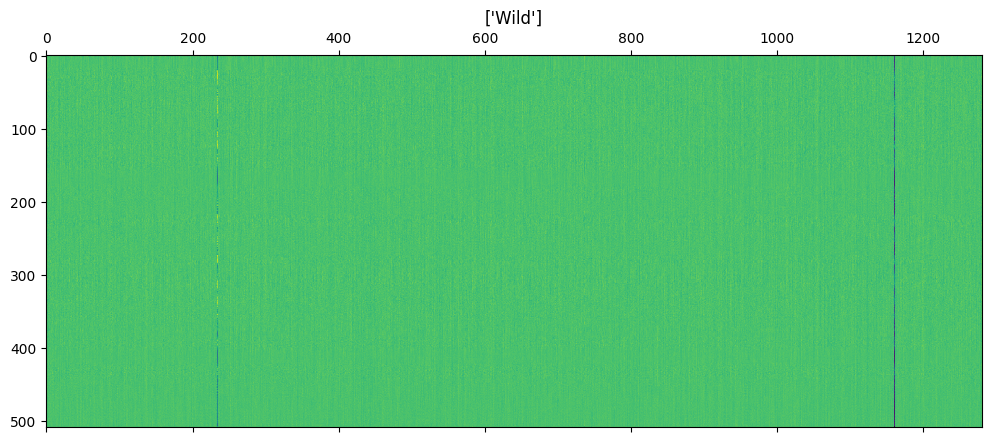

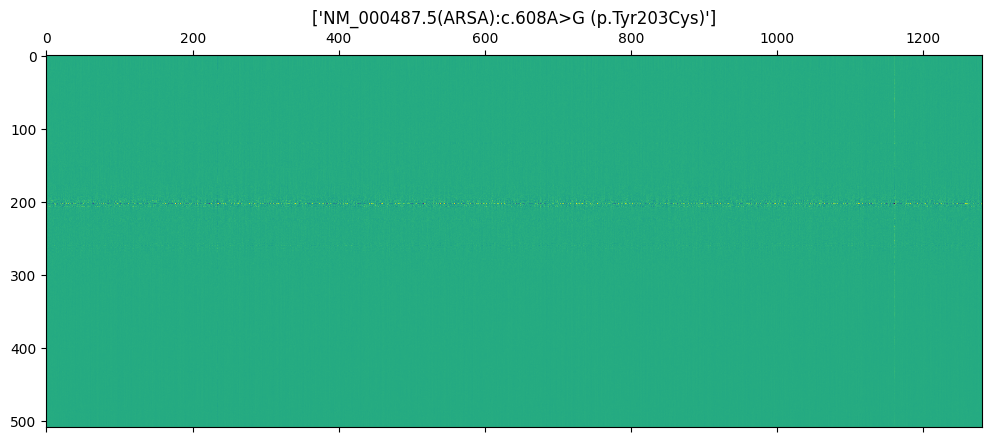

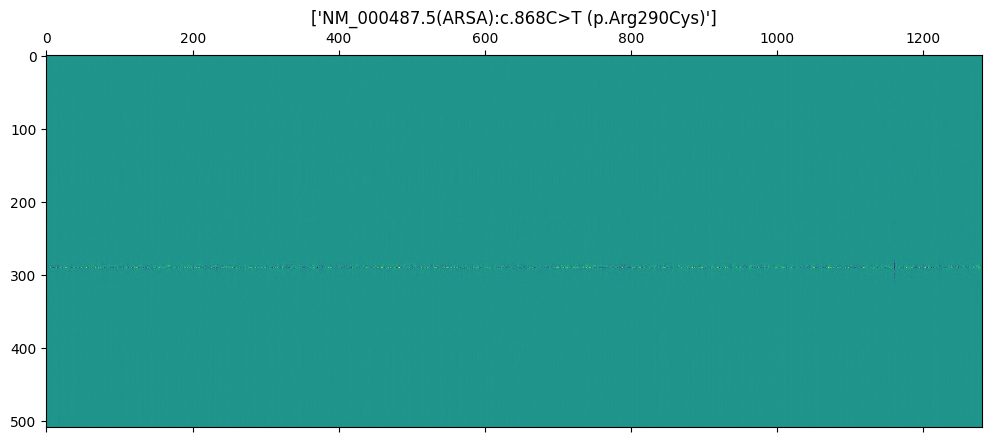

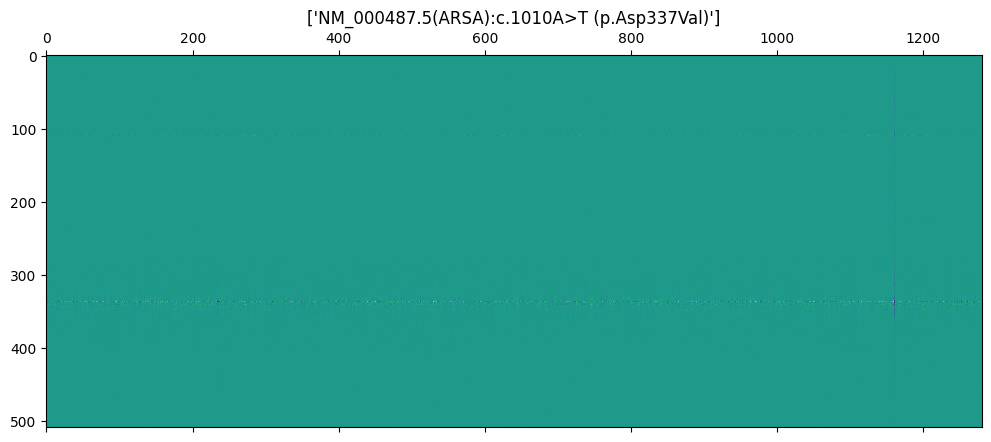

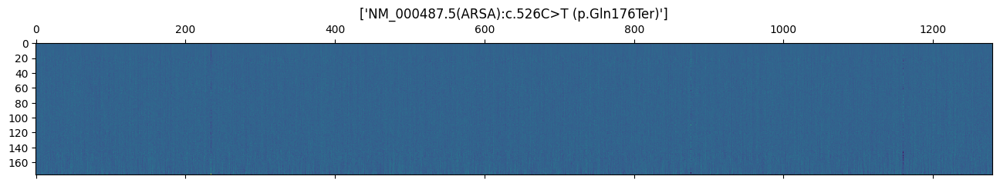

...

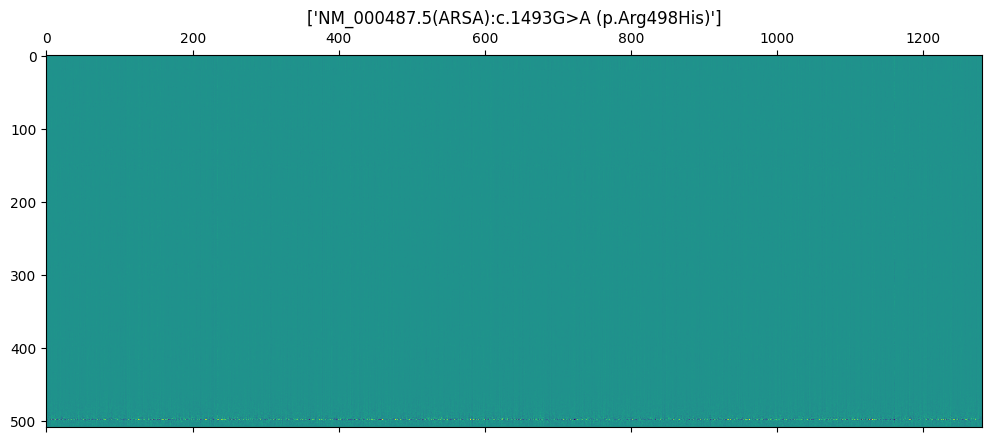

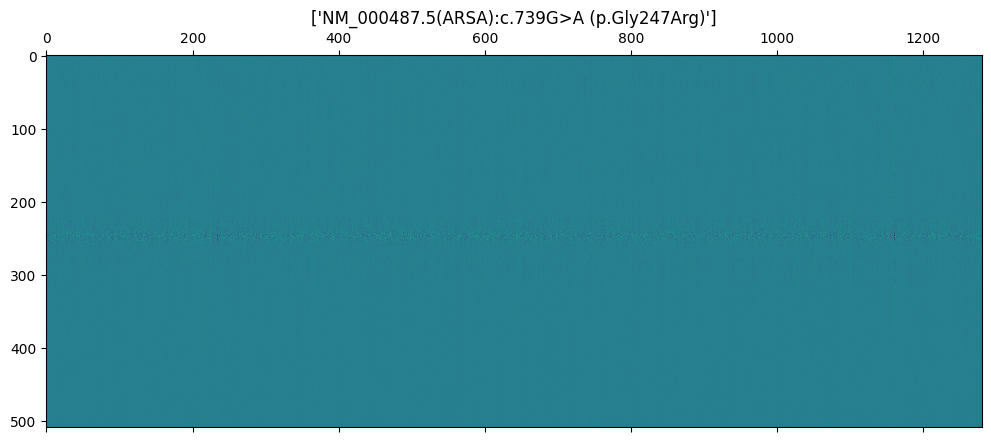

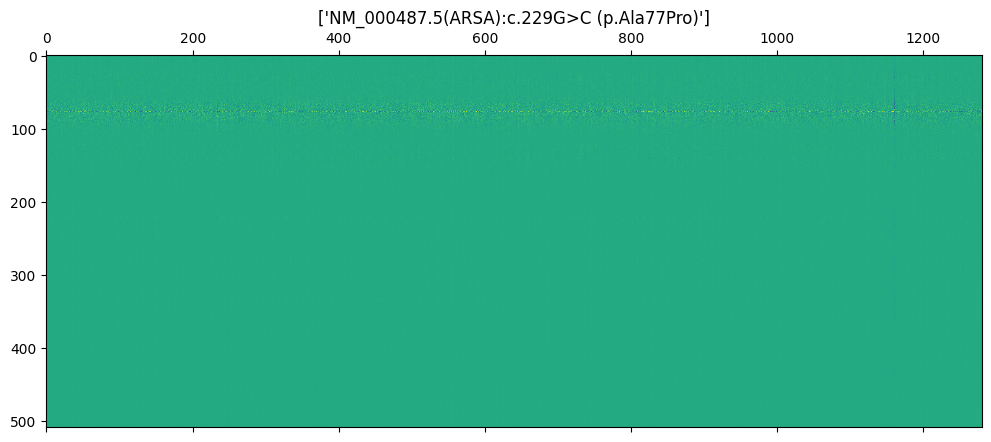

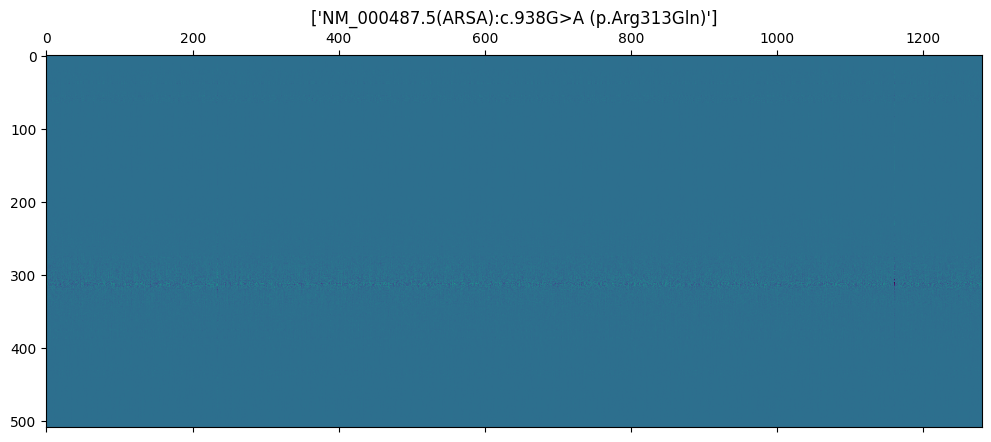

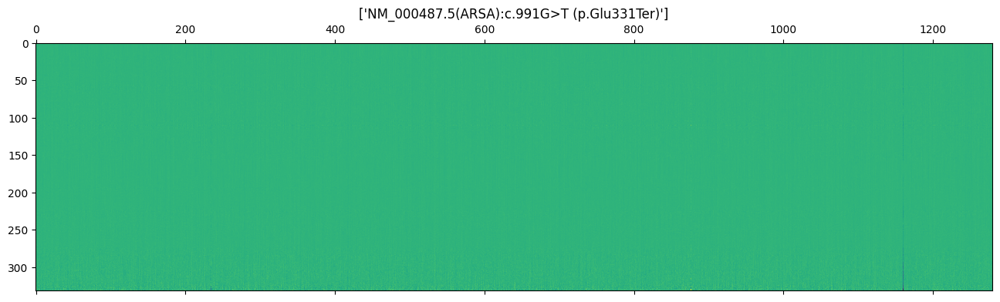

In [ ]:
embeds=ProteinSequencePair()
pred_batch_delta(embeds,'P15289')

In [3]:
embeds.all_sequences[embeds.all_sequences['Name']!='0']

,Unnamed: 0,#AlleleID,Label,UniProt,Name,Seq
18463,18600,79035,1.0,P15289,NM_000487.5(ARSA):c.608A>G (p.Tyr203Cys),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14730,14856,26637,1.0,O43602,NM_178151.2(DCX):c.574C>T (p.Arg192Trp),MELDFGHFDERDKTSRNMRGSRMNGLPSPTHSAHCSFYRTRTLQAL...
12465,12585,246433,1.0,P01130,NM_000527.4(LDLR):c.1968C>G (p.His656Gln),MGPWGWKLRWTVALLLAAAGTAVGDRCERNEFQCQDGKCISYKWVC...
17849,17986,477531,1.0,Q86YC2,NM_024675.3(PALB2):c.1945A>T (p.Lys649Ter),MDEPPGKPLSCEEKEKLKEKLAFLKREYSKTLARLQRAQRAEKIKH...
14764,14890,26883,1.0,P51608,NM_004992.3(MECP2):c.454C>G (p.Pro152Ala),MVAGMLGLREEKSEDQDLQGLKDKPLKFKKVKKDKKEEKEGKHEPV...
...,...,...,...,...,...,...
23813,23975,426445,1.0,P08559,NM_000284.3(PDHA1):c.364G>A (p.Gly122Ser),MRKMLAAVSRVLSGASQKPASRVLVASRNFANDATFEIKKCDLHRL...
16347,16476,363926,-1.0,Q9BYX4,NM_022168.4(IFIH1):c.1879G>T (p.Glu627Ter),MSNGYSTDENFRYLISCFRARVKMYIQVEPVLDYLTFLPAEVKEQI...
22469,22630,59171,-1.0,P49815,NM_000548.4(TSC2):c.856A>G (p.Met286Val),MAKPTSKDSGLKEKFKILLGLGTPRPNPRSAEGKQTEFIITAEILR...
24077,24239,430637,1.0,Q13620,NM_003588.3(CUL4B):c.2687G>A (p.Arg896Gln),MMSQSSGSGDGNDDEATTSKDGGFSSPSPSAAAAAQEVRSATDGNT...


In [8]:
embeds.get_idx_from_uniprot('P15289')

Int64Index([18463, 14136, 14137, 15843, 16076, 14130, 18464, 14133, 14128,
            23629, 23634, 15844, 14129, 14135, 23630, 23216, 18468, 18462,
            23631, 23632, 18465, 12932, 12933, 14132, 14140, 24071, 14138,
             6202, 18984, 18467, 14131, 18985, 14139, 18311, 18466, 12934,
            18983, 14134, 23633, 18469, 18986],
           dtype='int64')

In [3]:
set_P15289=copy.deepcopy(embeds)
set_P15289.all_sequences=embeds.all_sequences[embeds.all_sequences['UniProt']=='P15289']
dataloader = DataLoader(set_P15289, batch_size=2,
                            shuffle=False, num_workers=10)
eee=Esm_infer()
trainer=pl.Trainer(accelerator="gpu")
preds=trainer.predict(eee,dataloader ,return_predictions=True)


/scratch/user/zshuying/.conda/envs/yuning/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /scratch/user/zshuying/.conda/envs/yuning/lib/python ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/scratch/user/zshuying/.conda/envs/yuning/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /scratch/user/zshuying/.conda/envs/yuning/lib/python ...
  rank_zero_warn(
You are using a CUDA device ('NVIDIA A100-PCIE-40GB') 

Predicting DataLoader 0: 100%|██████████| 21/21 [00:06<00:00,  3.09it/s]


In [8]:
preds2=torch.vstack(preds)

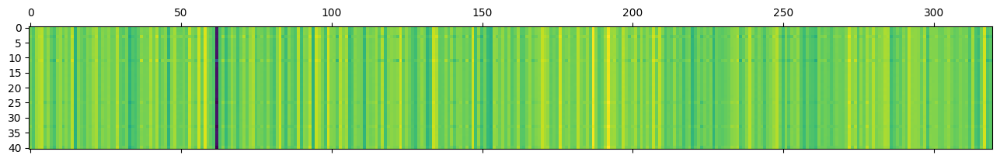

In [10]:
import matplotlib.pyplot as pyplot
pyplot.matshow(preds2)

In [13]:
set_P15289.all_sequences[set_P15289.all_sequences.Name=='0']

,Unnamed: 0,#AlleleID,Label,UniProt,Name,Seq
6202,6275,0,-1.0,P15289,0,MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...


In [19]:
set_P15289.all_sequences[set_P15289.all_sequences.Name!='0']

,Unnamed: 0,#AlleleID,Label,UniProt,Name,Seq
18463,18600,79035,1.0,P15289,NM_000487.5(ARSA):c.608A>G (p.Tyr203Cys),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14136,14258,18116,1.0,P15289,NM_000487.5(ARSA):c.868C>T (p.Arg290Cys),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14137,14259,18119,1.0,P15289,NM_000487.5(ARSA):c.1010A>T (p.Asp337Val),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
15843,15972,358682,1.0,P15289,NM_000487.5(ARSA):c.526C>T (p.Gln176Ter),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
16076,16205,360618,1.0,P15289,NM_000487.5(ARSA):c.979G>A (p.Gly327Ser),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14130,14252,18093,1.0,P15289,NM_000487.5(ARSA):c.293C>T (p.Ser98Phe),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
18464,18601,79039,1.0,P15289,NM_000487.5(ARSA):c.737G>A (p.Arg246His),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14133,14255,18112,1.0,P15289,NM_000487.5(ARSA):c.736C>T (p.Arg246Cys),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
14128,14250,18091,1.0,P15289,NM_000487.5(ARSA):c.1283C>T (p.Pro428Leu),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...
23629,23791,424607,1.0,P15289,NM_000487.5(ARSA):c.1274A>G (p.His425Arg),MGAPRSLLLALAAGLAVARPPNIVLIFADDLGYGDLGCYGHPSSTT...


In [30]:
def find_pos(name):
    if name=='0': return 0
    change=name.split('p.')[1]
    obj=re.match(r'([a-zA-Z]+)([0-9]+)([a-zA-Z]+)',change)
    return obj.group(2)

203
290
337
176
327
98
246
246
428
425
33
141
101
276
284
309
300
86
200
182
249
393
86
214
255
313
372
0
195
295
181
329
384
320
290
257
498
247
77
313
331


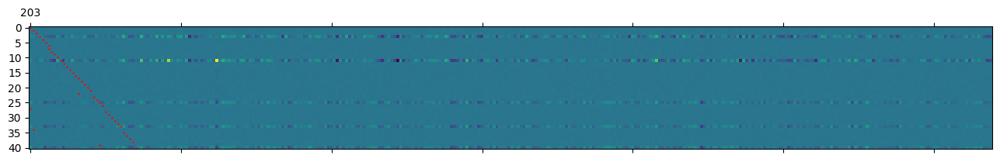

In [42]:
from matplotlib.patches import Circle
preds_delta=preds2-preds2[27,:]
# fig,ax = plt.subplots(1)
# ax.set_aspect('equal')
fig=plt.matshow(preds_delta)
for i in range(41):
    j=find_pos(set_P15289.all_sequences.iloc[i,:]['Name'])
    print(j)
    plt.scatter(j, i, edgecolors='red',s=0.5,marker='o')


In [15]:
set_P15289.all_sequences.index

Int64Index([18463, 14136, 14137, 15843, 16076, 14130, 18464, 14133, 14128,
            23629, 23634, 15844, 14129, 14135, 23630, 23216, 18468, 18462,
            23631, 23632, 18465, 12932, 12933, 14132, 14140, 24071, 14138,
             6202, 18984, 18467, 14131, 18985, 14139, 18311, 18466, 12934,
            18983, 14134, 23633, 18469, 18986],
           dtype='int64')

### Visualizations of Embeddings from esm1_t34_670M_UR50S()


In [15]:
embs=EsmMeanEmbeddings(if_initial_merge=True,dirpath='/scratch/user/zshuying/ppi_mutation/data/esm1_t34_670M_UR50S')

all_short_labels_8.pt
all_short_labels_4.pt
all_short_predictions_2.pt
file all_short_predictions_2.pt has been loaded 
all_short_labels_6.pt
all_short_labels_3.pt
all_short_labels_10.pt
all_short_labels_11.pt
all_short_labels_0.pt
all_short_predictions_8.pt
file all_short_predictions_8.pt has been loaded 
all_short_predictions_3.pt
file all_short_predictions_3.pt has been loaded 
all_short_labels_1.pt
all_short_predictions_7.pt
file all_short_predictions_7.pt has been loaded 
all_short_predictions_1.pt
file all_short_predictions_1.pt has been loaded 
all_short_labels_7.pt
all_short_predictions_10.pt
file all_short_predictions_10.pt has been loaded 
all_short_predictions_11.pt
file all_short_predictions_11.pt has been loaded 
all_short_predictions_4.pt
file all_short_predictions_4.pt has been loaded 
all_short_predictions_6.pt
file all_short_predictions_6.pt has been loaded 
all_short_predictions_0.pt
file all_short_predictions_0.pt has been loaded 
all_short_labels_2.pt
all_short_pred

In [17]:
seq=torch.load('/scratch/user/zshuying/ppi_mutation/data/esm1_t34_670M_UR50S/2019_all_esm_embeddings.pt')
# seq=torch.vstack([seq[:1032,:],seq[1033:3074,:],seq[3075:,:]])
label=torch.load('/scratch/user/zshuying/ppi_mutation/data/esm1_t34_670M_UR50S/2019_all_labels_for_embeddings.pt')
# label=np.hstack([label[:1032],label[1033:3074],label[3075:]])
for i in range(seq.shape[0]):
    if True in torch.isnan(seq[i,:]):
        print('NaN found in %s row: %s'%(i,seq[i,:]))

NaN found in 276 row: tensor([nan, nan, nan,  ..., nan, nan, nan])
NaN found in 6235 row: tensor([nan, nan, nan,  ..., nan, nan, nan])
NaN found in 10730 row: tensor([nan, nan, nan,  ..., nan, nan, nan])


In [23]:
seq=torch.vstack([seq[:276,:],seq[277:6235,:],seq[6236:10730,:],seq[10731:,:]])


In [28]:
proSeq.all_sequences.Seq

8985     MVMACRVVNKRRHMGLQQLSSFAETGRTFLGPLKSSKFIIDEECHE...
4253     MSFVAGVIRRLDETVVNRIAAGEVIQRPANAIKEMIENCLDAKSTS...
18463    MGGLEKKKYERGSATNYITRNKARKKLQLSLADFRRLCILKGIYPH...
14730    MVMSSYMVNSKYVDPKFPPCEEYLQGGYLGEQGADYYGGGAQGADF...
12465    MSQAYSSSQRVSSYRRTFGGAPGFPLGSPLSSPVFPRAGFGSKGSS...
                               ...                        
4247     MAENLLDGPPNPKRAKLSSPGFSANDSTDFGSLFDLENDLPDELIP...
24077    MNNQARTPAPSSARTSTSVRASTPTRTPTPLRTPTPVRTRTPIRTL...
11019    METPSQRRATRSGAQASSTPLSPTRITRLQEKEDLQELNDRLAVYI...
9884     MTEYKLVVVGAGGVGKSALTIQLIQNHFVDEYDPTIEDSYRKQVVI...
23541    MKWKHVPFLVMISLLSLSPNHLFLAQLIPDPEDVERGNDHGTPIPT...
Name: Seq, Length: 24955, dtype: object

In [20]:
remove_indices = [276,6235,10730]
labels = [i for j, i in enumerate(label) if j not in remove_indices]

In [26]:
proSeq=ProteinSequence(test_mode=False)
proSeq.all_sequences.Seq.isna()

Reading file
dataset shuffled


8985     False
4253     False
18463    False
14730    False
12465    False
         ...  
4247     False
24077    False
11019    False
9884     False
23541    False
Name: Seq, Length: 24955, dtype: bool

In [39]:
label2=[1 if label >0 else 0 for label in labels]

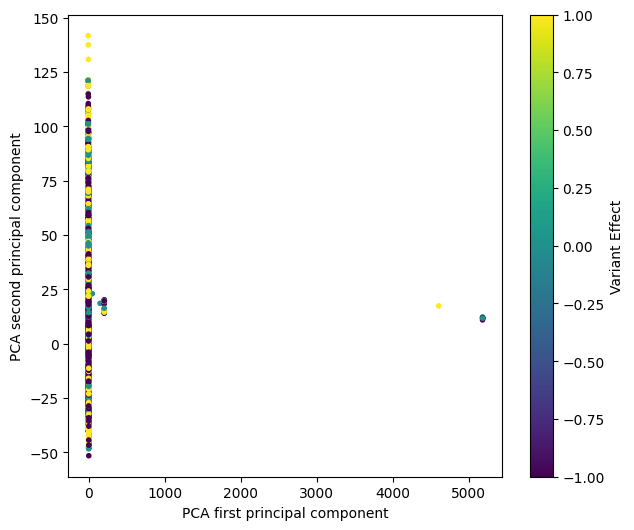

In [25]:
pca = PCA(40)


X= pca.fit_transform(seq)
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = ax.scatter(X[:,0], X[:,1], c=labels, marker='.')
ax.set_xlabel('PCA first principal component')
ax.set_ylabel('PCA second principal component')
plt.colorbar(sc, label='Variant Effect')

In [29]:
import scipy
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import SVC, SVR
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression, SGDRegressor

In [40]:
train_size = 0.8
Xs_train, Xs_test, ys_train, ys_test = train_test_split(seq, label2, train_size=train_size, random_state=42)
Xs_train.shape, Xs_test.shape, len(ys_train), len(ys_test)
pca = PCA(60)
Xs_train_pca = pca.fit_transform(Xs_train)
knn_grid = {
    'n_neighbors': [5, 10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree', 'brute'],
    'leaf_size' : [15, 30],
    'p' : [1, 2],
}

svm_grid = {
    'C' : [0.1, 1.0, 10.0],
    'kernel' :['linear', 'poly', 'rbf', 'sigmoid'],
    'degree' : [3],
    'gamma': ['scale'],
}

rfr_grid = {
    'n_estimators' : [20],
    'criterion' : ['mse', 'mae'],
    'max_features': ['sqrt', 'log2'],
    'min_samples_split' : [5, 10],
    'min_samples_leaf': [1, 4]
}
cls_list = [KNeighborsClassifier, SVC, RandomForestClassifier]
param_grid_list = [knn_grid, svm_grid, rfr_grid]
result_list = []
grid_list = []
for cls_name, param_grid in zip(cls_list, param_grid_list):
    print(cls_name)
    grid = GridSearchCV(
        estimator = cls_name(), 
        param_grid = param_grid,
        scoring = 'roc_auc',
        verbose = 1,
        n_jobs = -1 # use all available cores
    )
    grid.fit(Xs_train_pca, ys_train)
    result_list.append(pd.DataFrame.from_dict(grid.cv_results_))
    grid_list.append(grid)


<class 'sklearn.neighbors._regression.KNeighborsRegressor'>
Fitting 5 folds for each of 48 candidates, totalling 240 fits
<class 'sklearn.svm._classes.SVR'>
Fitting 5 folds for each of 12 candidates, totalling 60 fits


KeyboardInterrupt: 

### K Nearest Neighbors

In [32]:
result_list[0].sort_values('rank_test_score')[:5]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,param_p,param_weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
12,0.046082,0.015443,2.144361,0.134257,ball_tree,30,10,1,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",-0.098338,-0.065727,-0.107696,-0.09053,-0.088684,-0.090195,0.013955,1
28,0.075682,0.033572,1.604830,0.057587,kd_tree,30,10,1,uniform,"{'algorithm': 'kd_tree', 'leaf_size': 30, 'n_n...",-0.098338,-0.065727,-0.107696,-0.09030,-0.089011,-0.090215,0.013948,2
20,0.051173,0.003114,2.416722,0.056934,kd_tree,15,10,1,uniform,"{'algorithm': 'kd_tree', 'leaf_size': 15, 'n_n...",-0.098338,-0.066030,-0.107696,-0.09030,-0.089011,-0.090275,0.013841,3
44,0.008527,0.001343,0.846057,0.070669,brute,30,10,1,uniform,"{'algorithm': 'brute', 'leaf_size': 30, 'n_nei...",-0.098338,-0.066030,-0.107696,-0.09030,-0.089011,-0.090275,0.013841,3
36,0.007393,0.000818,1.002207,0.045418,brute,15,10,1,uniform,"{'algorithm': 'brute', 'leaf_size': 15, 'n_nei...",-0.098338,-0.066030,-0.107696,-0.09030,-0.089011,-0.090275,0.013841,3


In [33]:
result_list[1].sort_values('rank_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
2,6.773306,0.237812,1.842880,0.017602,0.1,3,scale,rbf,"{'C': 0.1, 'degree': 3, 'gamma': 'scale', 'ker...",0.004015,0.007189,-0.001207,0.005817,0.000619,0.003287,0.003146,1
6,6.969749,0.243438,1.828691,0.038134,1.0,3,scale,rbf,"{'C': 1.0, 'degree': 3, 'gamma': 'scale', 'ker...",0.002142,0.010281,-0.046397,-0.002516,-0.028041,-0.012906,0.021084,2
4,127.619035,5.563308,0.437641,0.010850,1.0,3,scale,linear,"{'C': 1.0, 'degree': 3, 'gamma': 'scale', 'ker...",-0.031357,-0.038770,-0.104842,-0.028046,-0.053552,-0.051314,0.028168,3
0,24.023198,2.874899,0.446552,0.007720,0.1,3,scale,linear,"{'C': 0.1, 'degree': 3, 'gamma': 'scale', 'ker...",-0.031316,-0.038511,-0.105537,-0.027401,-0.053966,-0.051346,0.028576,4
8,944.154809,22.586451,0.434109,0.011322,10.0,3,scale,linear,"{'C': 10.0, 'degree': 3, 'gamma': 'scale', 'ke...",-0.031939,-0.035908,-0.121885,-0.047468,-0.053426,-0.058125,0.032803,5
10,6.110370,0.199536,1.509681,0.035380,10.0,3,scale,rbf,"{'C': 10.0, 'degree': 3, 'gamma': 'scale', 'ke...",-0.043465,-0.041434,-0.108793,-0.067560,-0.100285,-0.072307,0.028006,6
3,6.586603,0.380942,0.991773,0.044929,0.1,3,scale,sigmoid,"{'C': 0.1, 'degree': 3, 'gamma': 'scale', 'ker...",0.002582,-0.006608,-0.009851,-0.094065,-1.290218,-0.279632,0.506496,7
1,5.067219,0.321864,0.595561,0.033950,0.1,3,scale,poly,"{'C': 0.1, 'degree': 3, 'gamma': 'scale', 'ker...",-0.000903,0.002069,-0.003259,0.000131,-33.545442,-6.709481,13.417981,8
5,5.801745,0.512631,0.565934,0.017871,1.0,3,scale,poly,"{'C': 1.0, 'degree': 3, 'gamma': 'scale', 'ker...",-0.002247,0.005965,-0.003586,-0.000380,-40.270649,-8.054179,16.108235,9
9,5.435976,0.747655,0.542776,0.036394,10.0,3,scale,poly,"{'C': 10.0, 'degree': 3, 'gamma': 'scale', 'ke...",-0.004736,0.009108,-0.005146,0.003841,-105.173710,-21.034129,42.069791,10


In [34]:
result_list[2].sort_values('rank_test_score')[:5]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
11,84.363232,18.662987,0.006955,0.000616,mae,sqrt,4,10,20,"{'criterion': 'mae', 'max_features': 'sqrt', '...",-0.019914,-0.009359,-0.008735,-0.025814,-0.041332,-0.021031,0.012031,1
10,92.352521,15.108972,0.007532,0.000437,mae,sqrt,4,5,20,"{'criterion': 'mae', 'max_features': 'sqrt', '...",-0.026111,-0.007166,-0.020265,-0.029934,-0.027811,-0.022257,0.008201,2
15,78.092068,11.046190,0.007976,0.000566,mae,log2,4,10,20,"{'criterion': 'mae', 'max_features': 'log2', '...",-0.023712,-0.015165,-0.030118,-0.032818,-0.028100,-0.025983,0.006172,3
14,85.678143,11.090505,0.007942,0.000513,mae,log2,4,5,20,"{'criterion': 'mae', 'max_features': 'log2', '...",-0.029834,-0.021983,-0.027622,-0.039776,-0.031223,-0.030088,0.005779,4
7,0.611173,0.014987,0.011808,0.001153,mse,log2,4,10,20,"{'criterion': 'mse', 'max_features': 'log2', '...",-0.065295,-0.046010,-0.051155,-0.067274,-0.073049,-0.060556,0.010233,5


In [35]:
Xs_test_pca = pca.transform(Xs_test)
for grid in grid_list:
    print(grid.best_estimator_)
    print()
    preds = grid.predict(Xs_test_pca)
    print(f'{scipy.stats.spearmanr(ys_test, preds)}')
    print('\n', '-' * 80, '\n')


KNeighborsRegressor(algorithm='ball_tree', n_neighbors=10, p=1)

SpearmanrResult(correlation=0.014538247715879905, pvalue=0.47070553772711654)

 -------------------------------------------------------------------------------- 

SVR(C=0.1)

SpearmanrResult(correlation=0.05207868546100193, pvalue=0.00972207264990679)

 -------------------------------------------------------------------------------- 

RandomForestRegressor(criterion='mae', max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=20)

SpearmanrResult(correlation=0.05710578428513174, pvalue=0.004574940124784384)

 -------------------------------------------------------------------------------- 

